In [1]:
from astropy.table import Table
from dendrocat import RadioSource
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from scipy import interpolate
import pandas as pd
import sympy as syp
from astropy import units as u
import radio_beam
from astropy.table import Table
from radio_beam import Beam
from astropy import coordinates
from astropy import wcs
from astropy.nddata.utils import Cutout2D
from astropy.io import ascii
from matplotlib.patches import Rectangle, Ellipse, Circle
import Paths.Paths as paths
import seaborn as sns

Path = paths.filepaths()


/home/t.yoo/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from matplotlib import colors
import astropy.units as u
import matplotlib as mpl
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=50
plt.rcParams['ytick.labelsize']=50
plt.rcParams['axes.titlesize']=60
mpl.rcParams['axes.linewidth'] = 10
mpl.rcParams['xtick.major.size'] = 10
mpl.rcParams['xtick.major.width'] = 4
mpl.rcParams['xtick.minor.size'] = 5
mpl.rcParams['xtick.minor.width'] = 2
mpl.rcParams['ytick.major.size'] = 10
mpl.rcParams['ytick.major.width'] = 4
mpl.rcParams['ytick.minor.size'] = 5
mpl.rcParams['ytick.minor.width'] = 2
class core_catdata():
    def __init__(self,catfile, almaimf_beam, hrfits, start_coreno, band='B3', recommend_criteria = 'b6', include_ff=False ):
        catdata_w51e = ascii.read(catfile,data_start=0,format='commented_header', header_start=120,  comment="!")
        geo_avg_beam = np.sqrt(almaimf_beam.major.to(u.arcsec).value*almaimf_beam.minor.to(u.arcsec).value)
        corr_factor = catdata_w51e['AFWHM02'] * catdata_w51e['BFWHM02'] / catdata_w51e['AFWHM03'] / catdata_w51e['BFWHM03']
        numcore_tot = len(catdata_w51e['AFWHM02'])
        if include_ff:
            coreno_merged = start_coreno[0] + start_coreno[1]
            print('coreno_merged',coreno_merged)
            coreno_merged.sort()
            coreno_start = coreno_merged
            print('coreno_start',coreno_start)
        else:
            coreno_start = start_coreno[0]
        coreidx_start = [i for i in range(numcore_tot) if catdata_w51e['NO'][i] in coreno_start]
        if recommend_criteria == 'b6b3':
            coreidx = [idx for idx in coreidx_start if all([np.abs(catdata_w51e['GOODM02'][idx])>1,  
                       np.abs(catdata_w51e['SIGNM02'][idx])>1,  
                       catdata_w51e['FXP_BST02'][idx]/catdata_w51e['FXP_ERR02'][idx]>2, 
                       catdata_w51e['FXT_BST02'][idx]/catdata_w51e['FXT_ERR02'][idx]>2, 
                       catdata_w51e['AFWHM02'][idx]/catdata_w51e['BFWHM02'][idx]<2 ,
                        catdata_w51e['FOOA02'][idx]/catdata_w51e['AFWHM02'][idx]>1.15 ,
                        np.sqrt(catdata_w51e['AFWHM03'][idx]*catdata_w51e['BFWHM03'][idx]) <4 * geo_avg_beam  ,
                        catdata_w51e['AFWHM03'][idx]/catdata_w51e['BFWHM03'][idx]<=2 ,
                        np.abs(catdata_w51e['SIGNM03'][idx])>1 ,
                        catdata_w51e['FXP_BST03'][idx]/catdata_w51e['FXP_ERR03'][idx]>1,  
                        catdata_w51e['FXT_BST03'][idx]/catdata_w51e['FXT_ERR03'][idx]>1])]
        elif recommend_criteria == 'b6':
            coreidx = coreidx_start                  
       
        
       
        yso_image = fits.open(hrfits)[0].data[0][0]
        hrhdr = fits.open(hrfits)[0].header
        inside_idx = exist_inside_FOV(catdata_w51e['WCS_ACOOR'], catdata_w51e['WCS_DCOOR'], yso_image, hrhdr)
   
        rec_ind = np.intersect1d(coreidx, inside_idx)
        print('total core number = ', len(catdata_w51e['WCS_ACOOR']))
        print(hrfits)
        print('robust %s measurement before applying FoV criteria = '%band, len(coreidx))
        print('robust %s measurement after applying FoV criteria = '%band, len(rec_ind))
       
        self.sky_ra = catdata_w51e['WCS_ACOOR'][rec_ind]
        self.sky_dec = catdata_w51e['WCS_DCOOR'][rec_ind]
        self.pix_x = catdata_w51e['XCO_P'][rec_ind]
        self.pix_y = catdata_w51e['YCO_P'][rec_ind]
        
        if band=='B3':
            bandind = 3
        else:
            bandind = 2

        self.afwhm = catdata_w51e['AFWHM0%d'%bandind][rec_ind] #arcsec
        self.bfwhm = catdata_w51e['BFWHM0%d'%bandind][rec_ind]

        self.asize = catdata_w51e['ASIZE0%d'%bandind][rec_ind]
        self.bsize = catdata_w51e['BSIZE0%d'%bandind][rec_ind]

        self.theta = catdata_w51e['THETA0%d'%bandind][rec_ind]
        
        self.flux = catdata_w51e['FXT_BST0%d'%bandind][rec_ind]
        self.fluxerr = catdata_w51e['FXT_ERR0%d'%bandind][rec_ind]
        self.flux_g = catdata_w51e['FXT_ALT0%d'%bandind][rec_ind]

        self.fooa = catdata_w51e['FOOA0%d'%bandind][rec_ind]
        self.foob = catdata_w51e['FOOB0%d'%bandind][rec_ind]
        
        self.int_peak = catdata_w51e['FXP_BST0%d'%bandind][rec_ind]
        self.interr_peak = catdata_w51e['FXP_ERR0%d'%bandind][rec_ind]
        
        self.size = (catdata_w51e['AFWHM0%d'%bandind][rec_ind]*catdata_w51e['BFWHM0%d'%bandind][rec_ind]**2)**(1/3)


        self.no = catdata_w51e['NO'][rec_ind]

        
        
        rescaled_3mmflux = catdata_w51e['FXT_BST03'][rec_ind] * catdata_w51e['AFWHM02'][rec_ind] * catdata_w51e['BFWHM02'][rec_ind] / catdata_w51e['AFWHM03'][rec_ind]/catdata_w51e['BFWHM03'][rec_ind]
        gamma = np.log10(catdata_w51e['FXT_BST02'][rec_ind] / rescaled_3mmflux)/np.log10(228.918/101.426)
        self.woffind = np.where(gamma>2)[0]
        self.wffind = np.where(gamma<2)[0]
        self.rec_ind = rec_ind


def count_points_in_ellipse(xcen,ycen,major,minor,pa,xpos,ypos):
    # caclulate foci positions 
    # must be full major, minor not semi major, minor
    fodx = np.cos(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    fody = np.sin(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    
    fox1 = xcen + fodx
    foy1 = ycen + fody
    
    fox2 = xcen - fodx
    foy2 = ycen - fody
    
    dist1 = np.sqrt((xpos-fox1)**2+(ypos-foy1)**2)
    dist2 = np.sqrt((xpos-fox2)**2+(ypos-foy2)**2)
    
    isinside = np.where(dist1+dist2<major)[0]
    
    return len(isinside), list(isinside)

def exist_inside_FOV(xcore_sky, ycore_sky, yso_image, hrhdr):
    isfinite = np.where(np.isfinite(yso_image))
    xfinite1 = np.min(isfinite[0])
    xfinite2 = np.max(isfinite[0])
    yfinite1 = np.min(isfinite[1])
    yfinite2 = np.max(isfinite[1])
     
    xcen = (xfinite1 + xfinite2)/2
    ycen = (yfinite1 + yfinite2)/2

    wcs_hr = WCS(hrhdr,naxis=2)
    xypos = wcs_hr.wcs_world2pix(np.vstack((xcore_sky,ycore_sky)).T,0)
    
    rad = np.abs(xfinite2 - xcen)
    
    
    dist = np.sqrt((xypos[:,0]- xcen)**2+(xypos[:,1]-ycen)**2)
    isinside = np.where(dist<rad)[0]
    
    return isinside
def plot_catalog_on_image(ax, hdr_image,  catdatadir, idx_start, isb3=False,beam=None,
                         color='cyan',lw=4,aperture='fwhm+beam',xysource=None,ls='solid',fontsize=30
                          ):
    catdata = ascii.read(catdatadir,data_start=0,format='commented_header', header_start=120,  comment="!")
    idx = [i for i in range(len(catdata['NO'])) if catdata['NO'][i] in idx_start]
    sky_ra = catdata['WCS_ACOOR'][idx]
    sky_dec = catdata['WCS_DCOOR'][idx]
    no = catdata['NO'][idx]
    if isb3:
        bandlabel = '03'
    else:
        bandlabel = '02'
    fooa = catdata['FOOA%s'%bandlabel][idx]
    foob = catdata['FOOB%s'%bandlabel][idx]
    theta = catdata['THETA%s'%bandlabel][idx]
    afwhm = catdata['AFWHM%s'%bandlabel][idx]
    bfwhm = catdata['BFWHM%s'%bandlabel][idx]
   
    
    skypos = np.vstack((sky_ra,sky_dec)).T

    
    wcsNB = WCS(hdr_image,naxis=2)

    xypos = wcsNB.wcs_world2pix(skypos,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    pixel_scale = wcsNB.proj_plane_pixel_scales()[0]
        
    indexlist = []
    for i in range(len(xypos)):
        if aperture is 'footprint':
            major = fooa[i]/3600/pixel_scale.value
            minor = foob[i]/3600/pixel_scale.value
            pa = theta[i]
        elif aperture is 'fwhm+beam':
            meanbeamsize = (beam.major.value+beam.minor.value)/4
            major = (afwhm[i]/3600+meanbeamsize)/pixel_scale.value
            minor = (bfwhm[i]/3600+meanbeamsize)/pixel_scale.value
            pa = theta[i]
        elif aperture is 'beam':
            major = beam.major.value/pixel_scale.value
            minor = beam.minor.value/pixel_scale.value
            pa = beam.pa.value
    
        ellipse = Ellipse(xypos[i],width=major,height=minor,facecolor='none',
                        angle=pa+90,edgecolor=color,lw=lw,ls=ls)
        
        ax.add_patch(ellipse)
        if xysource is not None:
            numsource, indsource = count_points_in_ellipse(xpos[i],ypos[i],major,minor,pa+90,xysource[:,0],xysource[:,1])
            

            ax.text(xpos[i]+50,ypos[i]+70,'%d'%numsource,color='w',fontsize=fontsize,clip_on=True)
            indexlist.append(indsource)
    if xysource is not None:
        return indexlist
    
def plot_dendrogram(ax, catalog , wcsNB=None,legend=True, size=40,color='r' ):
    if wcsNB is not None:
        xsky = catalog['x_sky']
        ysky = catalog['y_sky']
        xysky = np.vstack((xsky, ysky)).T
        xypos = wcsNB.wcs_world2pix(xysky,0)
        xpos = xypos[:,0]
        ypos = xypos[:,1]
        
    else:
        xpos = catalog['x_pix']
        ypos = catalog['y_pix']
    print(xpos,ypos)
    kind = catalog['kind']
    
    #detected in both band
    ind1 = np.where(kind==0)[0]
    print('ind1',ind1)
    ax.scatter(xpos[ind1], ypos[ind1], s=size, marker='x',color=color,label='B3B6')
    #detected in only one band
    ind2 = np.where(kind==1)[0]
    ax.scatter(xpos[ind2], ypos[ind2], s=size-10, marker='o',color='greenyellow',label='B3')
    ind3 = np.where(kind==2)[0]
    ax.scatter(xpos[ind3], ypos[ind3], s=size-10, marker='s',color='cyan',label='B6')
    
def plot_dendrogram_new(ax, catalog , wcsNB=None,legend=True, size=80,color='cyan',band='b6',facecolor='none' ):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]

 
    for i in range(len(xpos)):
        if xsky[i]<0:
            color='magenta'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='yellow'
            x = xpos[i]
            y = ypos[i]
        elif catalog['alpha'][i]<1.7:
            color='springgreen'
            x = xpos[i]
            y = ypos[i]
        else:
            color='cyan'
            x = xpos[i]
            y = ypos[i]
        ax.scatter(x,y, s=size, marker='o',edgecolor=color,facecolor=facecolor)
                        
def plot_dendrogram_circle(ax, catalog , wcsNB=None,legend=True, size=80,color='cyan',band='b6',lw=4,fill=False):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]

 
    for i in range(len(xpos)):
        if xsky[i]<0:
            color='magenta'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='yellow'
            x = xpos[i]
            y = ypos[i]
        elif catalog['alpha'][i]<1.7:
            color='springgreen'
            x = xpos[i]
            y = ypos[i]
        else:
            color='cyan'
            x = xpos[i]
            y = ypos[i]
        circle = Circle((x,y),radius=size, color=color,facecolor='none',lw=lw,fill=fill)
        ax.add_patch(circle)
        
def plot_dendrogram_arrow(ax, catalog ,extent=[],downarrow=[], wcsNB=None,legend=True, size=80,color='cyan',band='b6',lw=4,fill=False,xsort=True):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]
    
    x_both = np.array([xpos[i] if xsky[i]>0 else xpos_otherband[i] for i in range(len(xpos))])
    y_both = np.array([ypos[i] if xsky[i]>0 else ypos_otherband[i] for i in range(len(xpos))])

    
    insideind = np.where((x_both>extent[0])&(x_both<extent[1])&(y_both>extent[2])&(y_both<extent[3]))[0]
    
    x_both_inside = x_both[insideind]
    y_both_inside = y_both[insideind]
    
    if xsort:
        sortind = np.argsort(x_both_inside)
    else:
        sortind = np.argsort(y_both_inside)
    
    x_both_inside = x_both_inside[sortind]
    y_both_inside = y_both_inside[sortind]

        
        
 
    colors=sns.color_palette("tab10")


 
    for i in range(len(xpos)):
        if xsky[i]<0:
            color='yellow'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='magenta'
            x = xpos[i]
            y = ypos[i]
        elif catalog['group'][i]==0:
            color=colors[0]
            x = xpos[i]
            y = ypos[i]
        elif catalog['group'][i]==1:
            color=colors[1]
            x = xpos[i]
            y = ypos[i]
        else:
            color=colors[2]
            x = xpos[i]
            y = ypos[i]
        if i in downarrow:
            arrowoffset = -50
        else:
            arrowoffset = 50
        print(i,x,y)    
        ax.annotate("",xy=(x,y+arrowoffset/7), xycoords='data', textcoords='offset pixels',
                    arrowprops=dict(width=8, headwidth=20,ec=color,fc=color, ),xytext=(0,arrowoffset),fontsize=30,color=color)
      
                        
def add_scale_bar(ax, xpos,ypos,scale, pixel_scale, dist,height=20,color='w',pad=40,size=40,xoffset=0.05, forceint=False):
    phy_pix_scale = (pixel_scale * dist).to(u.kpc*u.rad)/u.rad
    print(phy_pix_scale.to(u.au))
    scaled_scale = (scale/phy_pix_scale).to(u.rad/u.rad)
    print(scaled_scale, xpos,ypos, height)
    ax.add_patch(Rectangle((xpos,ypos),scaled_scale.value,height,color=color))
    if forceint:
        if scale.unit.is_equivalent(u.pc):
            unit = 'pc'
        elif scale.unit.is_equivalent(u.au):
            unit = 'au'
        ax.text(xpos+(0.4+xoffset)*scaled_scale, ypos+pad, "%i %s"%(scale.value, unit), color=color,fontsize=size)
    else:
        ax.text(xpos+(0.4+xoffset)*scaled_scale, ypos+pad, f"{scale}", color=color,fontsize=size)
    
   

def add_beam(ax,xpos,ypos,beam, pixel_scale,color='w',square=False,square_size=800):
    width = beam.major / pixel_scale
    height = beam.minor /pixel_scale
    angle = beam.pa
    ax.add_patch(Ellipse((xpos,ypos),width.value,height.value,angle.value+90,color=color))
    if square:
        ax.scatter(xpos,ypos,facecolor='none', edgecolor=color,s=square_size,marker='s')


324.60000000006494 AU
63.5443026022967 1420 350 4


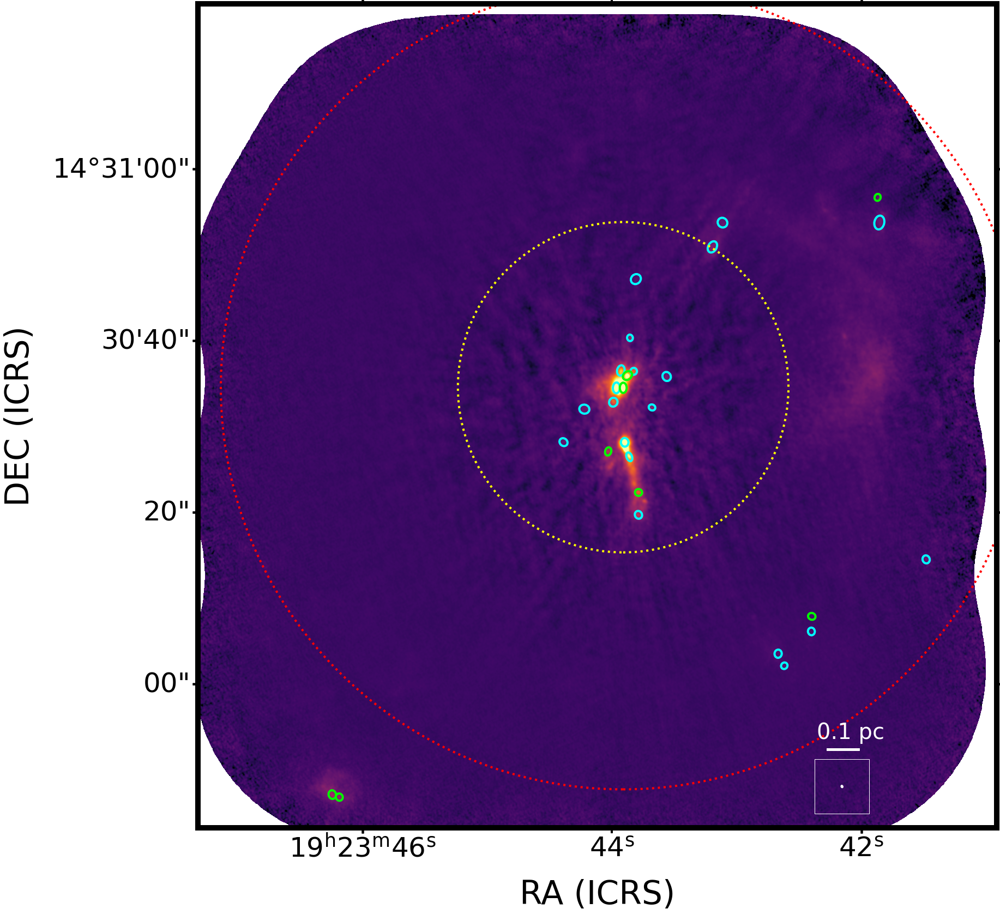

In [3]:

def draw_field_of_view(ax, image_highres, wcs_highres, wcs_lowres, color='r', lw=2, ls='dotted'):
    center = int(image_highres.shape[0]/2)
    index = np.where(np.isnan(image_highres[center,:])==False)[0]
    sky0 = wcs_highres.pixel_to_world(center, np.min(index))
    sky1 = wcs_highres.pixel_to_world(center, np.max(index))
    pix0_in_lowres = wcs_lowres.world_to_pixel(sky0)
    pix1_in_lowres = wcs_lowres.world_to_pixel(sky1)

    circle= Circle(( 
    pix0_in_lowres[0], (pix0_in_lowres[1].item()+pix1_in_lowres[1].item())/2),
    radius=(pix1_in_lowres[1].item()-pix0_in_lowres[1].item())/2, color=color,fill=False, lw=lw, ls=ls)
    ax.add_patch(circle)
fitsdata_highres_b3 = fits.open(Path.w51e_b3_tt0)
image_highres_b3 = fitsdata_highres_b3[0].data[0][0]
hdr_highres_b3 = fits.getheader(Path.w51e_b3_tt0)
wcs_highres_b3 = WCS(hdr_highres_b3,naxis=2)

fitsdata_highres_b6 = fits.open(Path.w51e_b6_tt0)
image_highres_b6 = fitsdata_highres_b6[0].data[0][0]
hdr_highres_b6 = fits.getheader(Path.w51e_b6_tt0)
wcs_highres_b6 = WCS(hdr_highres_b6,naxis=2)

fitsdata_almaimf = fits.open(Path.w51e_b6_almaimf)
image_almaimf = fitsdata_almaimf[0].data
if len(image_almaimf.shape)>2:
    image_almaimf = fitsdata_almaimf[0].data[0][0]
hdr_almaimf = fits.getheader(Path.w51e_b6_almaimf)  
beam_almaimf = Beam.from_fits_header(hdr_almaimf)
wcs_almaimf = WCS(hdr_almaimf,naxis=2)
scale_almaimf = wcs_almaimf.proj_plane_pixel_scales()[0]

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_almaimf)
ax1.imshow(image_almaimf, origin='lower',cmap=plt.get_cmap('inferno'),norm=colors.PowerNorm(gamma=0.5,vmin=-0.0035380786497514836, vmax=0.1014974178034381),)
plot_catalog_on_image(ax1,hdr_almaimf,Path.w51e_almaimf_catalog , [2,4,8,11,12,13,14,15,16,17,19,21,22,26,28,29,33,34,38,39],beam=beam_almaimf,color='cyan',
                    )
plot_catalog_on_image(ax1,hdr_almaimf,Path.w51e_almaimf_catalog , [1,3,5,6,9,10,18,27],beam=beam_almaimf,color='lime',
                     )
    
add_beam(ax1,1450,280, beam_almaimf, scale_almaimf,square=True,square_size=10000)
add_scale_bar(ax1, 1420, 350, 0.1*u.pc, scale_almaimf,5.41*u.kpc, xoffset=-0.7,height=4,pad=23)
draw_field_of_view(ax1,image_highres_b3, wcs_highres_b3, wcs_almaimf, color='r', lw=4, ls='dotted') 
draw_field_of_view(ax1,image_highres_b6, wcs_highres_b6, wcs_almaimf, color='yellow', lw=4, ls='dotted')    


ax1.set_xlim(200,1750)    
ax1.set_ylim(200,1800)    
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
 

plt.savefig('W51E-fragment1.png')

0 7802.000000012267 3471.000000008656
1 7761.000000001142 3517.0000000006876
2 7687.999999979981 3514.0000000054474
3 7680.000000005115 3555.0000000056016
4 7865.000000016255 3947.0000000159844
5 7576.000000014475 3941.0000000036093
6 7550.000000013166 3963.000000001465
7 8715.999999977905 4059.000000017832
8 7770.000000011129 4186.000000017592
9 7664.999999984221 4198.999999995776
10 7711.000000022098 4212.000000002494
11 7582.000000016582 4447.000000006047
12 7555.999999985237 4449.999999996109
13 7539.000000019188 4893.000000001612
14 9141.00000002658 4897.999999986267
15 6860.000000001279 4921.9999999998145
16 6588.000000023791 4930.0000000040545
17 6843.000000002833 4939.000000000838
18 6950.00000002096 5026.999999984888
19 6993.00000002177 5133.999999996275
20 7455.000000012136 5224.0000000121745
21 7432.000000010141 5241.00000000216
22 7379.999999977454 5278.000000002105
23 6806.000000013648 5390.999999999094
24 7082.000000018516 5395.999999996919
25 7436.999999998097 5408.99999

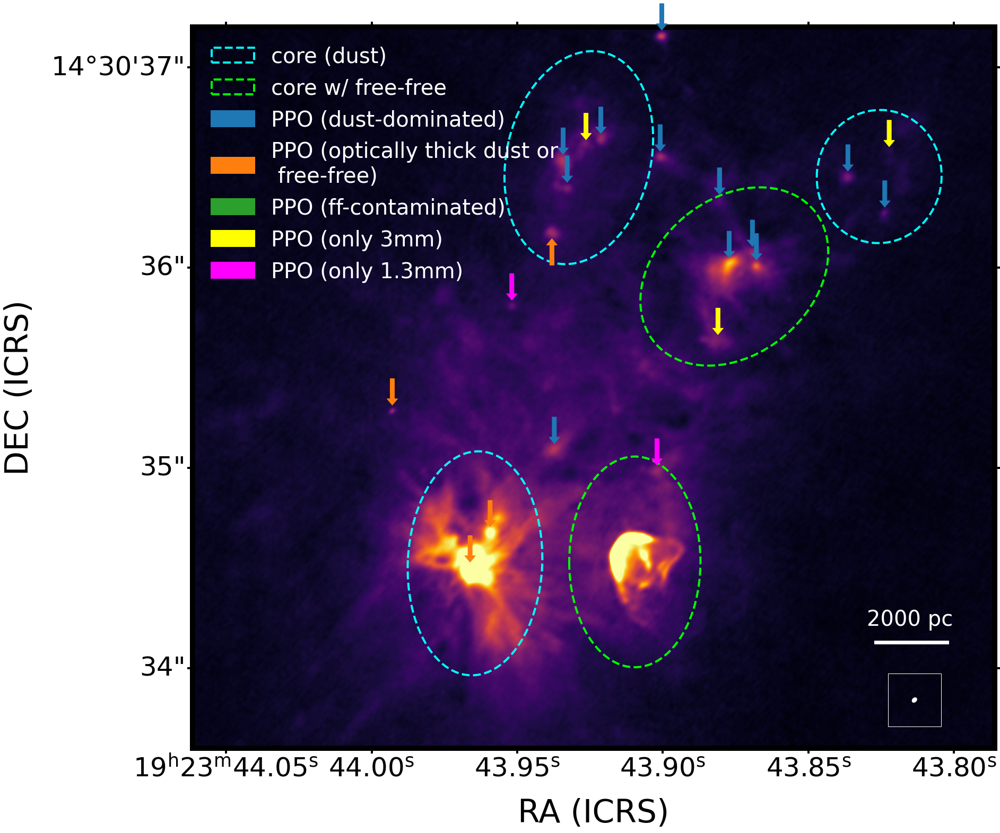

In [4]:
fitsdata_highres = fits.open(Path.w51e_b6_tt0)
image_highres = fitsdata_highres[0].data[0][0]
if len(image_highres.shape)>2:
    image_highres = fitsdata_highres[0].data[0][0]
hdr_highres = fits.getheader(Path.w51e_b6_tt0)  
beam_highres = Beam.from_fits_header(hdr_highres)

wcs_highres = WCS(hdr_highres,naxis=2)

scale_highres = wcs_highres.proj_plane_pixel_scales()[0]
catalog = Table.read(Path.w51e_dendro_matched_catalog_new,format='fits')

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_highres)
ax1.imshow(image_highres, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.00015829157200641937, vmax=0.00472556868900092)
plot_catalog_on_image(ax1,hdr_highres,Path.w51e_almaimf_catalog , [2,4,8,11,12,13,14,15,16,17,19,21,22,26,28,29,33,34,38,39],beam=beam_highres,color='cyan',
                    ls='dashed')
plot_catalog_on_image(ax1,hdr_highres,Path.w51e_almaimf_catalog , [1,3,5,6,9,10,18,27],beam=beam_highres,color='lime',ls='dashed'
                     )
plot_dendrogram_arrow(ax1, catalog, extent=[6700,7700,7000,7900],downarrow=[6,12,18,50,65],wcsNB = wcs_highres,size=20)


scale_almaimf = wcs_almaimf.proj_plane_pixel_scales()[0]
    
#add_beam(ax1,830,730, beam_almaimf, scale_almaimf,square=True,square_size=10000)
#add_scale_bar(ax1, 1200, 730, 0.1*u.pc, scale_almaimf,5.41*u.kpc, xoffset=-0.3,height=0.5,pad=10)
colors=sns.color_palette("tab10")

circle = Circle((0,0),radius=0, ls='dashed', color='cyan', label='core (dust)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, ls='dashed', color='lime', label='core w/ free-free',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[0], label='PPO (dust-dominated)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[1], label='PPO (optically thick dust or\n free-free)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[2], label='PPO (ff-contaminated)',lw=4, )
ax1.add_patch(circle)

circle = Circle((0,0),radius=0,  color='yellow', label='PPO (only 3mm)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='magenta', label='PPO (only 1.3mm)',lw=4, )
ax1.add_patch(circle)
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
ax1.legend(loc='upper left',fontsize=40,frameon=False, labelcolor='w')

#ax1.set_xlim(800,1300)    
#ax1.set_ylim(700,1350)    
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
ax1.set_xlim(6700,7700)    
ax1.set_ylim(7000,7900) 

add_beam(ax1,7600,7060, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7550, 7130, 2000*u.au, scale_highres,5.41*u.kpc, xoffset=-0.5,height=4,pad=23,forceint=True)

plt.savefig('W51E-fragment15.png')

NameError: name 'cat_w51e' is not defined

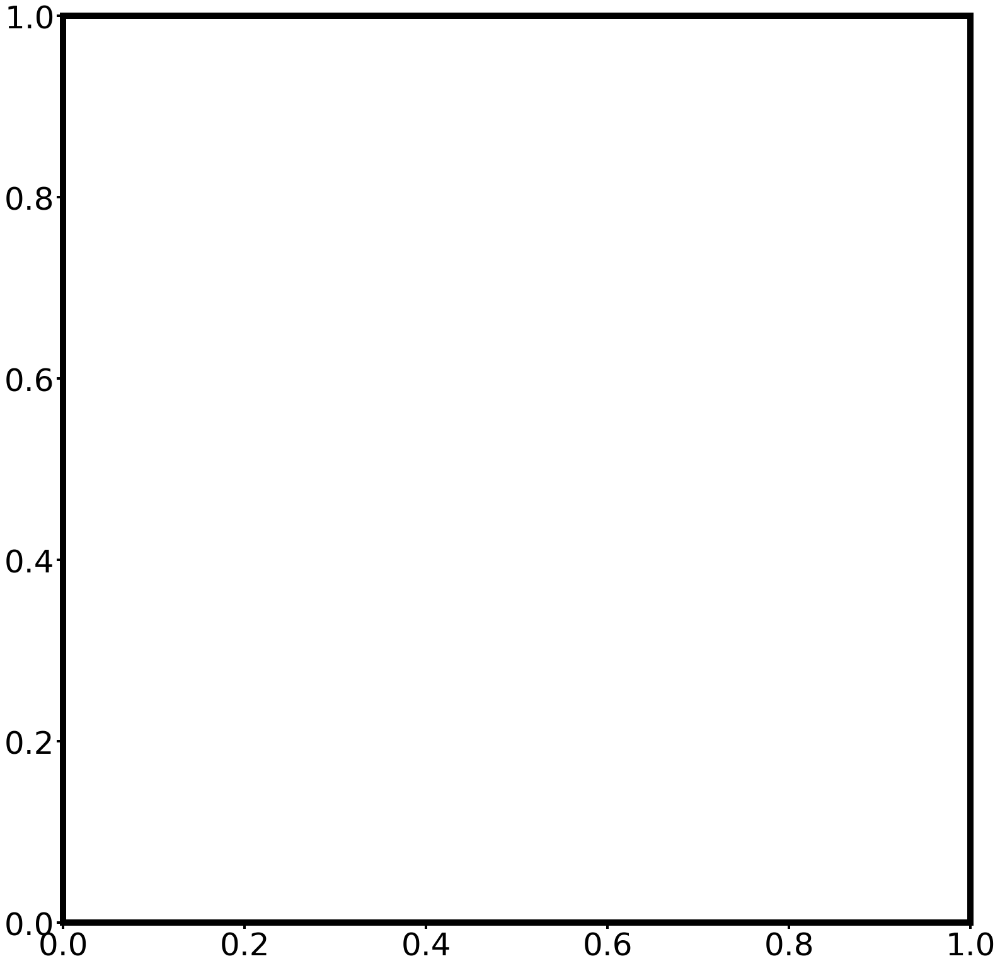

In [5]:

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.00015829157200641937, vmax=0.00472556868900092)
plot_dendrogram_arrow(ax1, catalog, extent=[6700,7700,7000,7900],downarrow=[6,12,18,],wcsNB = wcs_highres,size=20)
add_beam(ax1,6800,7100, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7550, 7100, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(6700,7700)    
ax1.set_ylim(7000,7900)
ax1.set_xticks([])
ax1.set_yticks([])

circle = Circle((0,0),radius=0, ls='dashed', color='w', label=r'core ($\alpha>2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, ls='dashed', color='lime', label=r'core ($\alpha<2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='cyan', label=r'YSO ($\alpha>1.7$)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='springgreen', label=r'YSO ($\alpha<1.7$)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='magenta', label='B3 only',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='B6 only',lw=4, )
ax1.add_patch(circle)
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
ax1.legend(loc='upper left',fontsize=40,frameon=False, labelcolor='w')
plt.savefig('W51E-fragment2_arrow.png')

21.639999999997837 AU
46.21072088725046 7550 7500 4


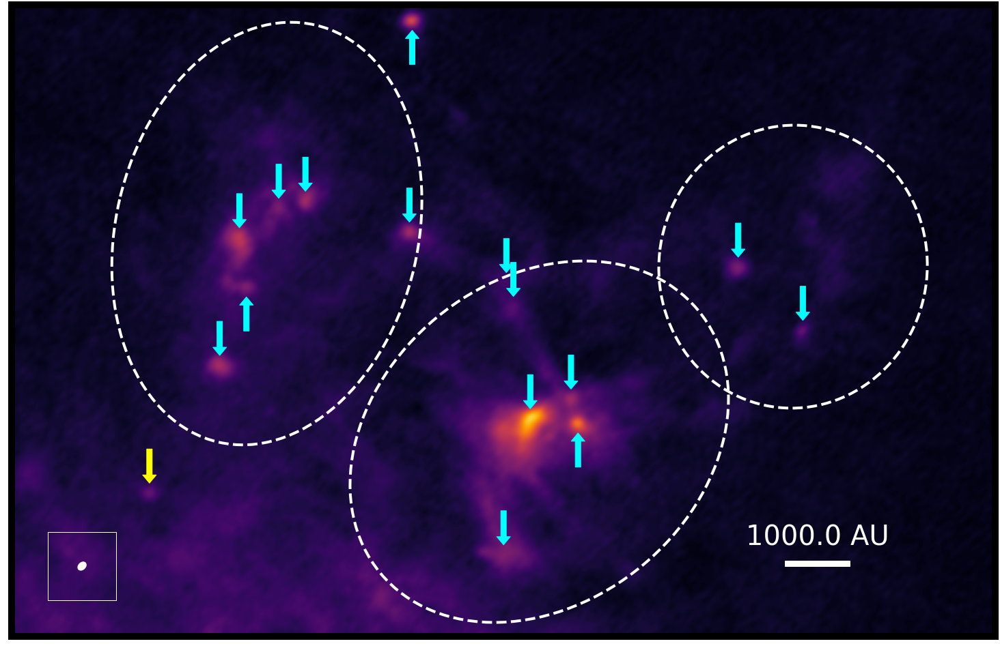

In [ ]:

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.00015829157200641937, vmax=0.00472556868900092)
plot_dendrogram_arrow(ax1, catalog, extent=[6700,7700,7000,7900],downarrow=[6,12,18,],wcsNB = wcs_highres,size=20)
add_beam(ax1,7050,7500, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7550, 7500, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(7000,7700)    
ax1.set_ylim(7450,7900)
ax1.set_xticks([])
ax1.set_yticks([])

circle = Circle((0,0),radius=0, ls='dashed', color='w', label=r'core ($\alpha>2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, ls='dashed', color='lime', label=r'core ($\alpha<2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='cyan', label=r'YSO ($\alpha>1.7$)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='springgreen', label=r'YSO ($\alpha<1.7$)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='magenta', label='B3 only',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='B6 only',lw=4, )
ax1.add_patch(circle)
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
#ax1.legend(loc='upper left',fontsize=40,frameon=False, labelcolor='w')
plt.savefig('W51E-fragment3.png')

21.639999999997837 AU
46.21072088725046 7550 7500 4


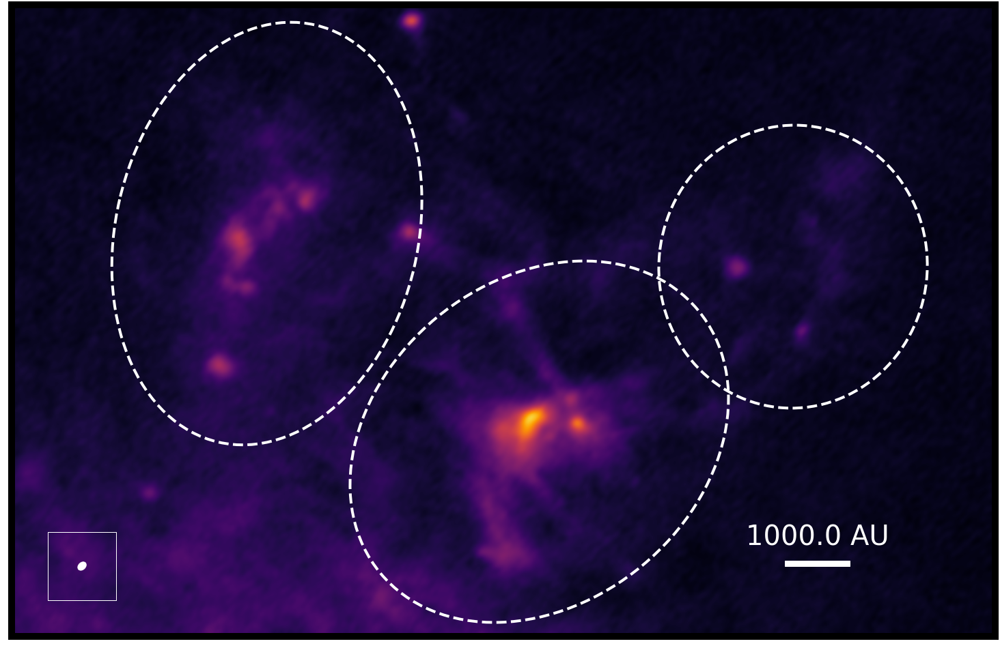

In [ ]:

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.00015829157200641937, vmax=0.00472556868900092)
#plot_dendrogram_arrow(ax1, catalog, extent=[6700,7700,7000,7900],downarrow=[6,12,18,],wcsNB = wcs_highres,size=20)
add_beam(ax1,7050,7500, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7550, 7500, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(7000,7700)    
ax1.set_ylim(7450,7900)
ax1.set_xticks([])
ax1.set_yticks([])

circle = Circle((0,0),radius=0, ls='dashed', color='w', label=r'core ($\alpha>2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, ls='dashed', color='lime', label=r'core ($\alpha<2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='cyan', label=r'YSO ($\alpha>1.7$)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='springgreen', label=r'YSO ($\alpha<1.7$)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='magenta', label='B3 only',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='B6 only',lw=4, )
ax1.add_patch(circle)
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
#ax1.legend(loc='upper left',fontsize=40,frameon=False, labelcolor='w')
plt.savefig('W51E-fragment3_noarrow.png')

324.60000000006494 AU
3.080714725815773 1045.3470303690603 1071.9867843393433 0.5


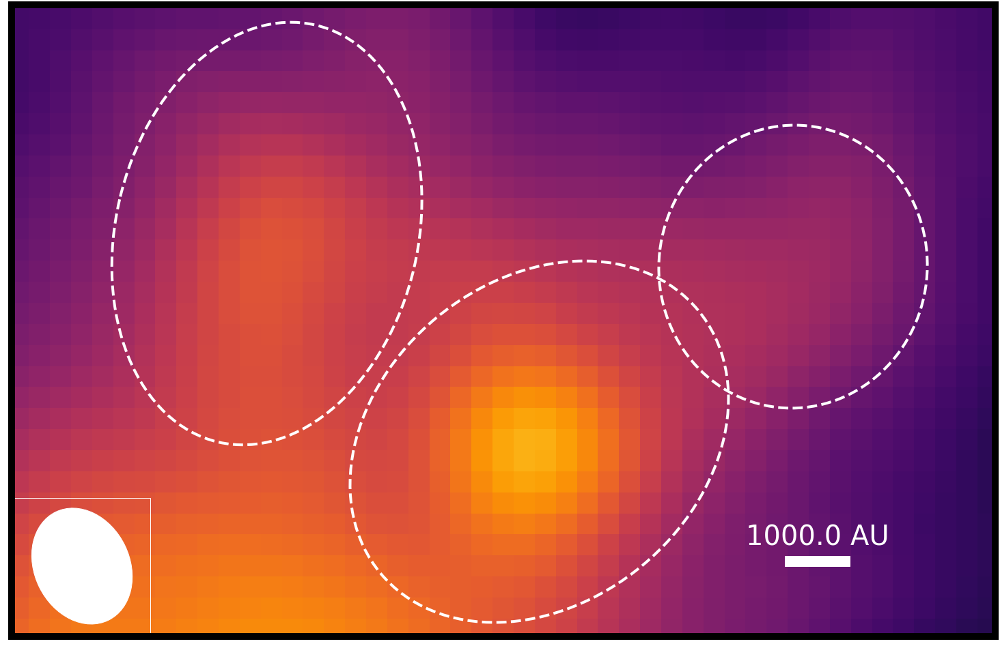

In [ ]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_almaimf,hdr_almaimf,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=0.005380786497514836, vmax=0.2014974178034381,ispower=True)
world_coord1 = wcs_highres.pixel_to_world(7000, 7450)
world_coord2 = wcs_highres.pixel_to_world(7700, 7900)
world_coord3 = wcs_highres.pixel_to_world(7050, 7500)
world_coord4 = wcs_highres.pixel_to_world(7550, 7500)

pix_coord1 = wcs_almaimf.world_to_pixel(world_coord1)
pix_coord2 = wcs_almaimf.world_to_pixel(world_coord2)
pix_coord3 = wcs_almaimf.world_to_pixel(world_coord3)
pix_coord4 = wcs_almaimf.world_to_pixel(world_coord4)

#plot_dendrogram_arrow(ax1, catalog, extent=[6700,7700,7000,7900],downarrow=[6,12,18,],wcsNB = wcs_highres,size=20)
add_beam(ax1,pix_coord3[0],pix_coord3[1], beam_almaimf, scale_almaimf,square=True,square_size=40000)
add_scale_bar(ax1, pix_coord4[0], pix_coord4[1], 1e3*u.au, scale_almaimf,5.41*u.kpc, xoffset=-1,height=0.5,pad=1)
ax1.set_xlim(pix_coord1[0],pix_coord2[0])    
ax1.set_ylim(pix_coord1[1],pix_coord2[1])
ax1.set_xticks([])
ax1.set_yticks([])

circle = Circle((0,0),radius=0, ls='dashed', color='w', label=r'core ($\alpha>2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, ls='dashed', color='lime', label=r'core ($\alpha<2$)',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='cyan', label=r'YSO ($\alpha>1.7$)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='springgreen', label=r'YSO ($\alpha<1.7$)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='magenta', label='B3 only',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='B6 only',lw=4, )
ax1.add_patch(circle)
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
#ax1.legend(loc='upper left',fontsize=40,frameon=False, labelcolor='w')
plt.savefig('W51E-fragment3_lowres.png')





21.639999999997837 AU
46.21072088725046 7050 6600 4


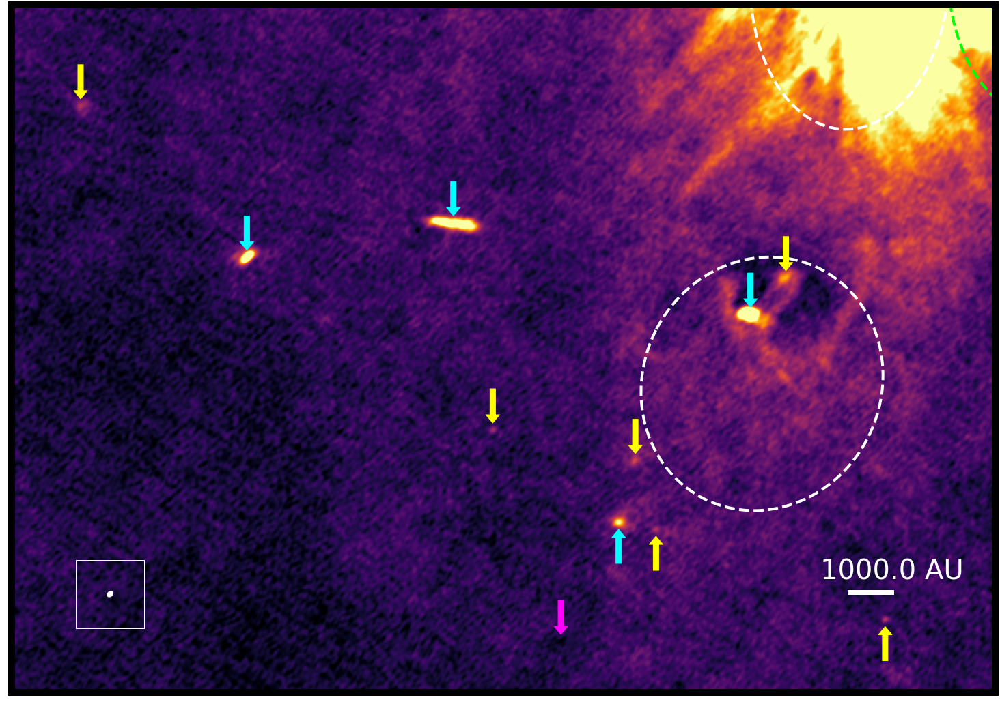

In [ ]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.00007221506578695015, vmax=0.0008449317463340403)
catalog = Table.read(w51e_dendro_matched_catalog,format='fits')
plot_dendrogram_arrow(ax1, catalog, extent=[6200,7200,6500,7200],downarrow=[5,7,10],wcsNB = wcs_highres,size=20)
add_beam(ax1,6300,6600, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7050, 6600, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(6200,7200)    
ax1.set_ylim(6500,7200)
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
plt.savefig('W51E-fragment3_arrow.png')

21.639999999997837 AU
46.21072088725046 7420 5080 4


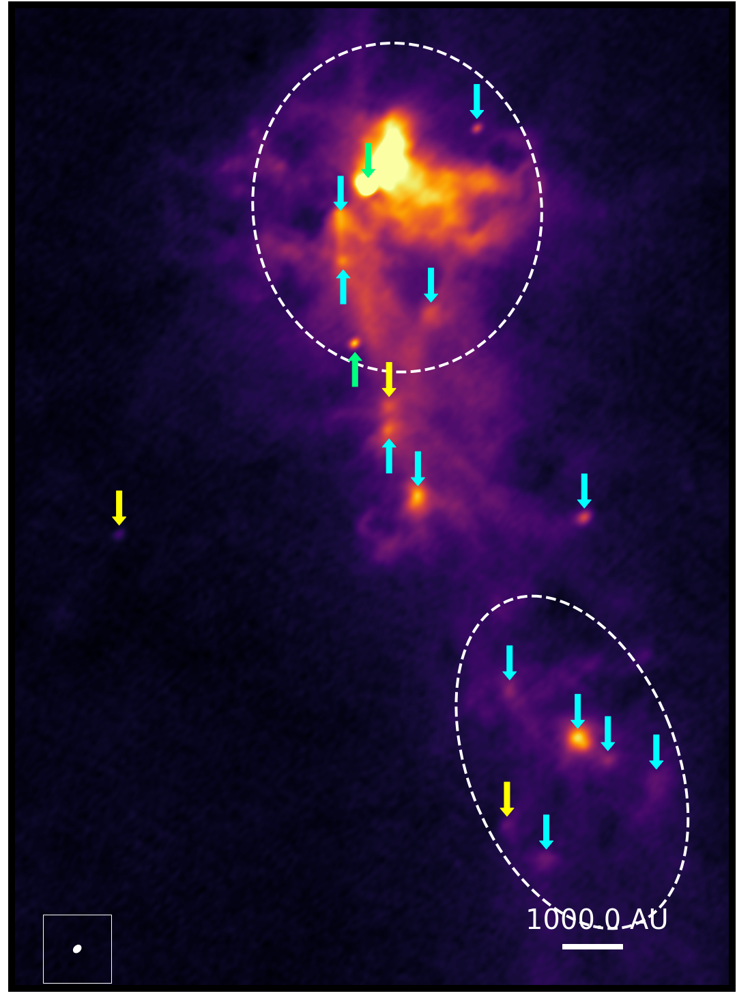

In [ ]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.0001582915720064193, vmax=0.0051303084896368875)
catalog = Table.read(w51e_dendro_matched_catalog,format='fits')
plot_dendrogram_arrow(ax1, catalog, extent=[7000,7550,5050,5800],downarrow=[9,11,13],wcsNB = wcs_highres,size=20, xsort=False)
add_beam(ax1,7050,5080, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7420, 5080, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(7000,7550)    
ax1.set_ylim(5050,5800)
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
plt.savefig('W51E-fragment4_arrow.png')

21.639999999997837 AU
46.21072088725046 7420 5080 4


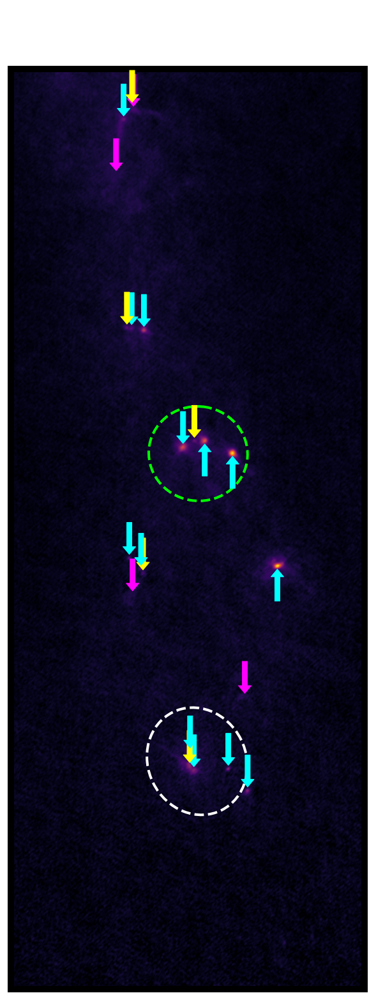

In [ ]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.0001582915720064193, vmax=0.0051303084896368875)
catalog = Table.read(w51e_dendro_matched_catalog,format='fits')
plot_dendrogram_arrow(ax1, catalog, extent=[7300,8050,3050,5900],downarrow=[9,11,13],wcsNB = wcs_highres,size=20, xsort=False)
add_beam(ax1,7050,5080, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7420, 5080, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(7300,8050)    
ax1.set_ylim(3050,5000)
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
plt.savefig('W51E-fragment4_arrow.png')

21.639999999997837 AU
46.21072088725046 7550 7500 4


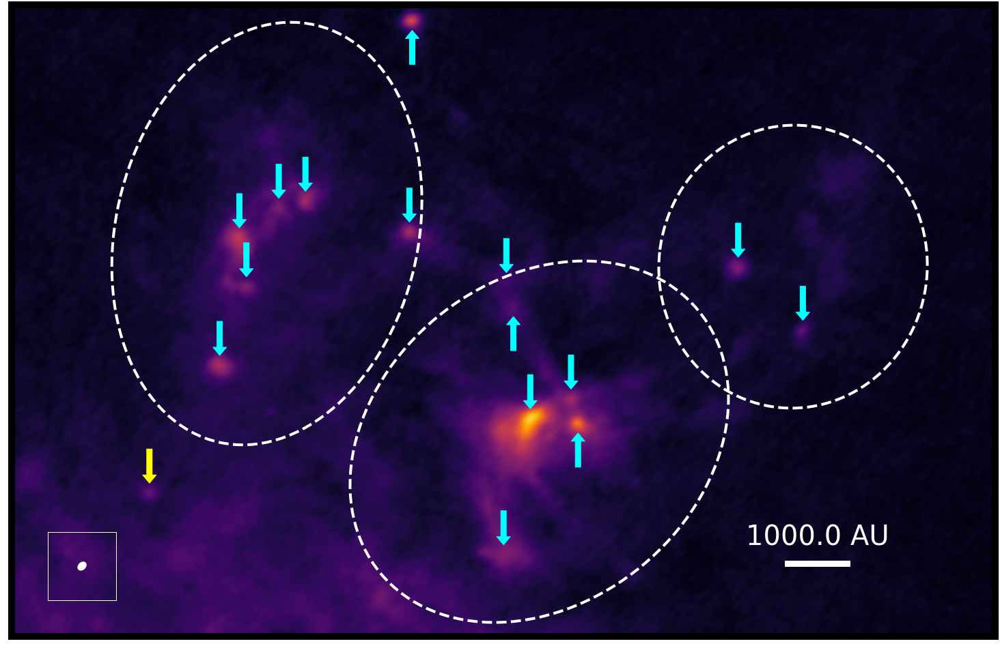

In [ ]:

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.0,0.0,1.0,1.0])
plot_catalog_on_image(ax1,image_highres,hdr_highres,cat_w51e,isb3=False,beam=beam_almaimf,use_criteria=True,ffcont=True,color='w',
                     vmin=-0.00015829157200641937, vmax=0.00472556868900092)
plot_dendrogram_arrow(ax1, catalog, extent=[7000,7700,7450,7900],downarrow=[2,7,15],wcsNB = wcs_highres,size=20,xsort=False)
add_beam(ax1,7050,7500, beam_highres, scale_highres,square=True,square_size=10000)
add_scale_bar(ax1, 7550, 7500, 1e3*u.au, scale_highres,5.41*u.kpc, xoffset=-1,height=4,pad=15)
ax1.set_xlim(7000,7700)    
ax1.set_ylim(7450,7900)
ax1.set_xticks([])
ax1.set_yticks([])

#ax1.set_xlabel('RA (ICRS)')
#ax1.set_ylabel('DEC (ICRS)')
plt.savefig('W51E-fragment22_arrow.png')